# Проект поиска изображений по текстовому описанию 

В рамках проекта необходимо реализовать демонстрационную версию системы поиска изображений по текстовому описанию. Задача состоит в том, чтобы по заданному текстовому запросу находить наиболее релевантные изображения из набора.
Модель на вход должна принимать векторные представления изображения и текста, а на выходе — предсказывать значение от 0 до 1, отражающее степень соответствия между ними

___
Цели:
- Выполнить предварительный анализ предоставленных данных
- Очистить датасет от шумов и нежелательных объектов (запрещенные изображения).
- Построить эмбеддинги изображений и текстов
- Объединить векторы и обучить модель предсказания степени соответствия
- Протестировать модель
- Дать рекомендации по улучшению

___

В рамках проекта предоставлены следующие файлы:

- **train_dataset** — основной датасет, содержащий пары (изображение, описание). Одно изображение может иметь до 5 различных описаний
- **CrowdAnnotations** — оценки соответствия изображения и описания от краудсорсеров.
  - количество подтверждений,
  - количество опровержений.
- **ExpertAnnotations** — оценки от трёх экспертов по шкале от 1 до 4, где 1 — полное несоответствие, 4 — полное соответствие. Предполагается агрегация этих оценок
- **train_images** — изображения, используемые для обучения модели
- **test_queries** — тестовые текстовые запросы и соответствующие им изображения. Формат идентификатора аналогичен обучающей выборке
- **test_images** — изображения, на которых будет производиться поиск по запросу

___

Этапы работы:
1. Провести исследовательский анализ данных, сформировать финальную выборку
2. Очистить изображения, которые нарушают законодательные ограничения
3. Построить эмбеддинги изображений
4. Векторизовать тексты
5. Объединить признаки и обучить модель.
6. Выполнить оценку модели на тестовых данных
7. Дать рекомендации


## Исследовательский анализ данных

In [ ]:
!pip install -q sentence-transformers


In [ ]:
import os
import re
import random
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from tqdm.notebook import tqdm as notebook_tqdm
tqdm.pandas()
from PIL import Image

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
nltk.download('punkt')
nltk.download('wordnet')

from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import Ridge

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sentence_transformers import SentenceTransformer

import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms

In [3]:
PATH = '/kaggle/input/search-image/to_upload'

In [4]:
train_data = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))

data_expert = pd.read_csv(os.path.join(PATH, 'ExpertAnnotations.tsv'), sep='\t', names=['image', 'query_id', 'first', 'second', 'third'])

test_query = pd.read_csv(os.path.join(PATH, 'test_queries.csv'), index_col=[0], sep='|')

In [5]:
test_images_path = os.path.join(PATH, 'test_images')
train_images_path = os.path.join(PATH, 'train_images')

test_images = []
for filename in os.listdir(test_images_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(test_images_path, filename)
        image = Image.open(image_path)
        test_images.append((filename, image))

test_image = pd.DataFrame(test_images, columns=['file_name', 'image'])
test_image.name = 'test_image'

train_images = []
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(train_images_path, filename)
        image = Image.open(image_path)
        train_images.append((filename, image))

train_image = pd.DataFrame(train_images, columns=['file_name', 'image'])
train_image.name = 'train_image'

In [6]:
def display_table_info(name, data):
    print(name)
    print()
    print('Размер датасета:', data.shape)
    print()
    display(data.head(3))
    print()
    data.info()
    print('')
    print('')
    print('')

display_table_info('train_data', train_data)
display_table_info('data_expert', data_expert)
display_table_info('test_query', test_query)
display_table_info('test_image', test_image)
display_table_info('train_image', train_image)

train_data

Размер датасета: (5822, 3)



,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB



data_expert

Размер датасета: (5822, 5)



,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB



test_query

Размер датасета: (500, 3)



,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg



<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB



test_image

Размер датасета: (100, 2)



,file_name,image
0,1319634306_816f21677f.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,3163198309_bbfe504f0a.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,2308256827_3c0a7d514d.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  100 non-null    object
 1   image      100 non-null    object
dtypes: object(2)
memory usage: 1.7+ KB



train_image

Размер датасета: (1000, 2)



,file_name,image
0,280706862_14c30d734a.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,929679367_ff8c7df2ee.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,1317292658_ba29330a0b.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  1000 non-null   object
 1   image      1000 non-null   object
dtypes: object(2)
memory usage: 15.8+ KB





In [7]:
print('Исследование данных\n')
print(' Уникальные изображения:')
print(' - На трейне:', len(train_data['image'].unique()))
print(' - На тесте :', len(test_query['image'].unique()))
print()
print('Уникальные текстовые описания:')
print(' - В train_data:', len(set(train_data['query_text'])))
print(' - В test_query:', len(set(test_query['query_text'])))
print(' - Пересекаются в обоих наборах:', len(set(train_data['query_text']) & set(test_query['query_text'])))
print()
print('Уникальных запросов в test_query:', test_query.drop_duplicates().shape[0])
print()
print('Уникальные пары фото-текст с оценками:')
print('  - Экспертами:', data_expert.drop_duplicates().shape[0])
print()
test_query['file_name'] = test_query['query_id'].apply(lambda x: x.split('#')[0])
mismatch_count = (test_query['file_name'] != test_query['image']).sum()
print(' Проверка соответствия query_id и image:')
print(f' - Несовпадающих пар: {mismatch_count}')
print()
train_images_set = set(train_data['image'])
test_images_set = set(test_query['image'])
common_images = train_images_set & test_images_set
print('Уникальные картинки, которые есть в обоих наборах:')
print(' - В train:', len(train_images_set))
print(' - В test :', len(test_images_set))
print(' - Совпадают:', len(common_images))


Исследование данных

 Уникальные изображения:
 - На трейне: 1000
 - На тесте : 100

Уникальные текстовые описания:
 - В train_data: 977
 - В test_query: 500
 - Пересекаются в обоих наборах: 0

Уникальных запросов в test_query: 500

Уникальные пары фото-текст с оценками:
  - Экспертами: 5822

 Проверка соответствия query_id и image:
 - Несовпадающих пар: 0

Уникальные картинки, которые есть в обоих наборах:
 - В train: 1000
 - В test : 100
 - Совпадают: 0


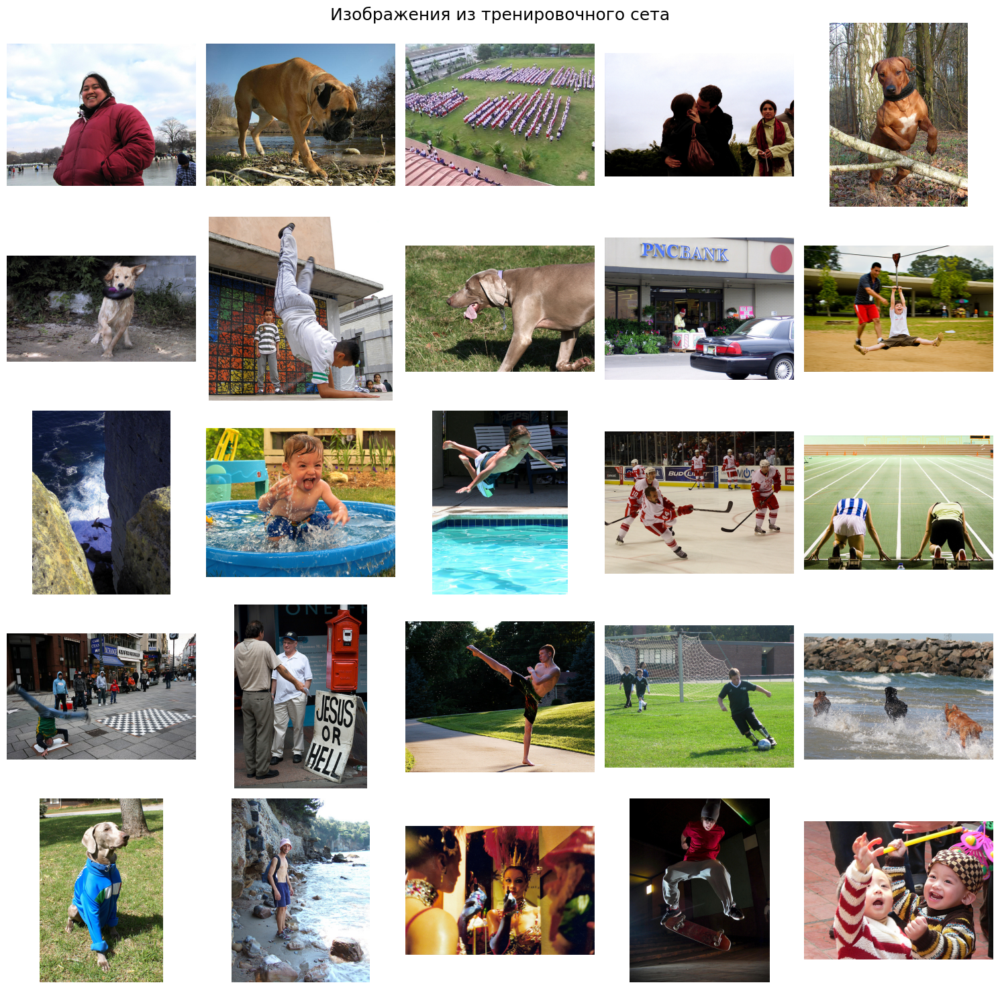

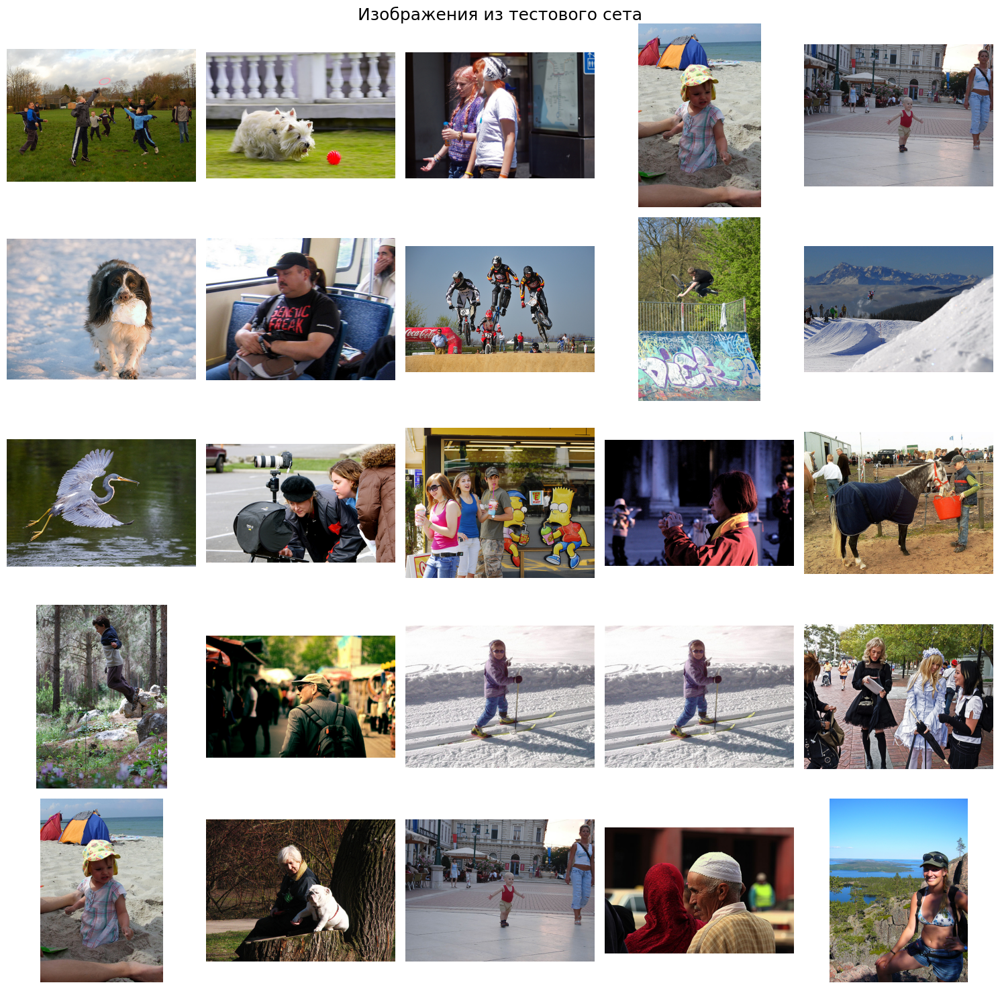

In [8]:

samples_train = list(train_data['image'].sample(25))
samples_test = list(test_query['image'].sample(25))

fig = plt.figure(figsize=(15, 15))

for i in range(25):
    fig.add_subplot(5, 5, i+1)
    image_path = Path(PATH) / 'train_images' / samples_train[i]
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
plt.suptitle('Изображения из тренировочного сета', fontsize=18)
plt.tight_layout()
plt.show()

fig = plt.figure(figsize=(15, 15))
for i in range(25):
    fig.add_subplot(5, 5, i+1)
    image_path = Path(PATH) / 'test_images' / samples_test[i]
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
plt.suptitle('Изображения из тестового сета', fontsize=18)
plt.tight_layout()
plt.show()


В рамках датасета каждая пара «изображение – текст» была оценена тремя независимыми экспертами по шкале от 1 до 4. Перед тем как использовать эти оценки в модели, необходимо агрегировать их в одну финальную метку.

Мы выбрали следующий способ
- Если два или более эксперта поставили одинаковую оценку — считается итоговой.
- Если все три оценки различаются (например, 1, 3, 4), берём среднее значение и округляем его до двух знаков после запятой.

Данный подход позволяет сохранить больше информации из оценок, не теряя редкие, но значимые случаи, когда мнения экспертов не совпадают. После агрегации оценки были нормализованы в диапазон 0 -1

Было принято решение воспользоваться только **экспертными оценками**, по следующим причинам:

- **Качество разметки**: экспертные оценки более точные и детализированные, так как специалисты используют шкалу от 1 до 4, а не бинарную оценку
- **Формат подходящий под задачу**: шкала 1–4 легко нормализуется до диапазона от 0 до 1
- **Надёжность**: краудсорсинг часто даёт шумные оценки 

Таким образом, наш выбор сделан на акцент в точности


In [9]:
def aggregate_expert_votes(row):
    votes = [row['first'], row['second'], row['third']]
    unique_votes = set(votes)

    if len(unique_votes) == 3:
        avg_vote = sum(votes) / 3
        return round(avg_vote, 2)
    else:
        majority_vote = max(unique_votes, key=votes.count)
        return majority_vote

data_expert['expert_raw'] = data_expert.progress_apply(aggregate_expert_votes, axis=1)

data_expert['score'] = (data_expert['expert_raw'] - 1) / 3.0

data_expert_clean = data_expert[['image', 'query_id', 'score']]

train_data = pd.merge(train_data, data_expert_clean, on=['image', 'query_id'], how='inner')

notna_texts = train_data[train_data['query_text'].notna()]

def fill_missing_text(row):
    if pd.isna(row['query_text']):
        found = notna_texts[notna_texts['query_id'] == row['query_id']]['query_text']
        if len(found) > 0:
            row['query_text'] = found.iloc[0]
    return row

train_data = train_data.progress_apply(fill_missing_text, axis=1)

train_data.dropna(subset=['query_text', 'score'], inplace=True)

display(train_data.head())
train_data.info()

100%|██████████| 5822/5822 [00:00<00:00, 33019.45it/s]


,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   score       5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


Выводы по блоку:

- Загрузили `train_dataset.csv`, `ExpertAnnotations.tsv`, `test_queries.csv`, изображения из `train_images` и `test_images`
- Датасет `CrowdAnnotations` с оценками с краудсорса не импортировался, так как мы выбрали путь агрегации оценок без него
- Провели обзор структуры каждого датасета: определили размерности, состав колонок, наличие пропусков и дубликатов
- Посмотрели примеры изображений из обучающего и тестового наборов, убедились в разнообразии данных. На изображениях разные объекты, сами фотографии тоже имеют разные положения и размеры
- Проверили, пересекаются ли изображения и описания между train и test (совпадений по изображениям нет, что корректно).
- Провели агрегацию оценок экспертов:
  - Если двое из трёх экспертов дали одинаковую оценку, то берём её как итоговую
  - Если оценки разные — усредняем и округляем до двух знаков после запятой
- Все оценки приведены к шкале от 0 до 1
- После объединения с `train_data` были удалены строки с отсутствующим текстом описания или целевой меткой.
- Все типы данных корретны и подходят для дальнейшей работы

На выходе получен финальный набор для обучения, в котором каждой паре "изображение — текст"

## Проверка данных

In [10]:
lemmatizer = WordNetLemmatizer()

BLOCK = ['child', 'boy', 'girl', 'baby', 'teen', 'teenager', 'kid',
         'infant', 'youngster', 'kids', 'children', 'boys', 'girls',
         'babies', 'teens', 'teenagers', 'youth', 'toddler', 'adolescent',
         'juvenile', 'offspring', 'minors', 'junior', 'tots', 'youthful',
         'newborn', 'little one', 'munchkin', 'toddlers']

def get_lemmas(text):
    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    tokens = word_tokenize(text)
    return [lemmatizer.lemmatize(token) for token in tokens]

In [11]:
def check_block(row):
    if isinstance(row['query_text'], str):
        lemmas = get_lemmas(row['query_text'])
        if any(word in BLOCK for word in lemmas):
            return 1
    return 0

train_data['to_block'] = train_data.progress_apply(check_block, axis=1)

100%|██████████| 5822/5822 [00:04<00:00, 1305.10it/s]


In [12]:
blocked_examples = train_data[train_data['to_block'] == 1]['query_text'].sample(10).unique()
print("Примеры заблокированных описаний:")
for text in blocked_examples:
    print('-', text)


Примеры заблокированных описаний:
- A young boy wearing a blue and red hat is using a camera near a swing set .
- The girls were in the crowd .
- A girl is swinging and looking down with her hair flying .
- A small boy with braids runs through a field of tall green grass .
- A blonde baby playing in the sand .
- Boys in life jackets on a watercraft .
- A smiling boy in an orange shirt with a safari hat sits at the playground , while a boy in a blue shirt looks on .
- A woman holds a fat baby with sunglasses and a denim hat .
- A young girl dressed in pink with a hair barrette pursing her lips at a big chocolate milkshake .
- A child doing a handstand on the beach .


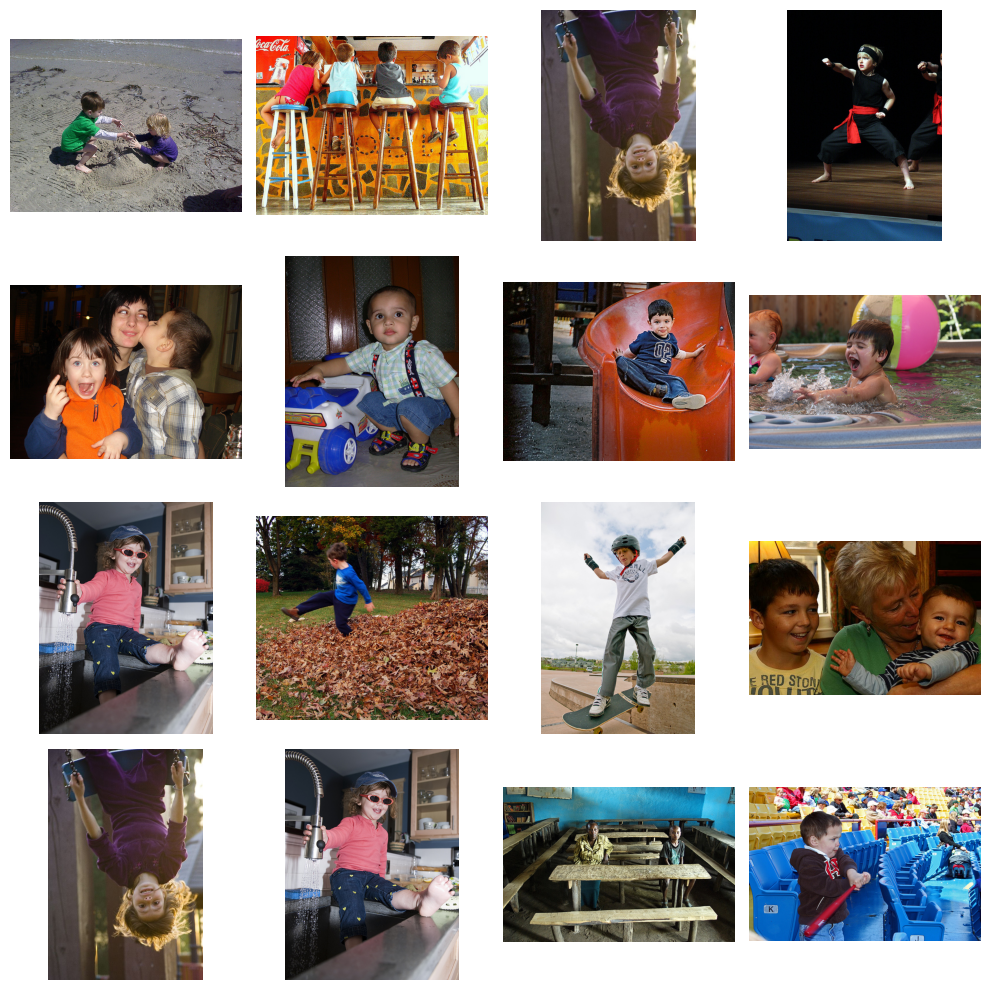

In [13]:
samples = list(train_data[train_data['to_block'] == 1]['query_id'].sample(16))
samples = [s[:-2] for s in samples]

fig = plt.figure(figsize=(10, 10))
for i in range(16):
    fig.add_subplot(4, 4, i + 1)
    image_path = Path(PATH) / 'train_images' / samples[i]
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()


В описании и на фотогорафиях только дети

In [14]:
bad_query_ids = train_data[train_data['to_block'] == 1]['query_id']
bad_images = [query_id.split('#')[0] for query_id in bad_query_ids]
train_data = train_data[~train_data['image'].isin(bad_images)].copy()

train_data.drop(columns='to_block', inplace=True)
train_data.reset_index(drop=True, inplace=True)

train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4076 entries, 0 to 4075
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4076 non-null   object 
 1   query_id    4076 non-null   object 
 2   query_text  4076 non-null   object 
 3   score       4076 non-null   float64
dtypes: float64(1), object(3)
memory usage: 127.5+ KB


In [15]:
image_gen = ImageDataGenerator(rescale=1. / 255)

image_flow = image_gen.flow_from_dataframe(
    dataframe=train_data,
    directory=Path(PATH, 'train_images'),
    x_col='image',
    y_col='score',
    target_size=(224, 224),
    batch_size=16,
    class_mode='input',
    seed=42,
    shuffle=False)


Found 4076 validated image filenames.


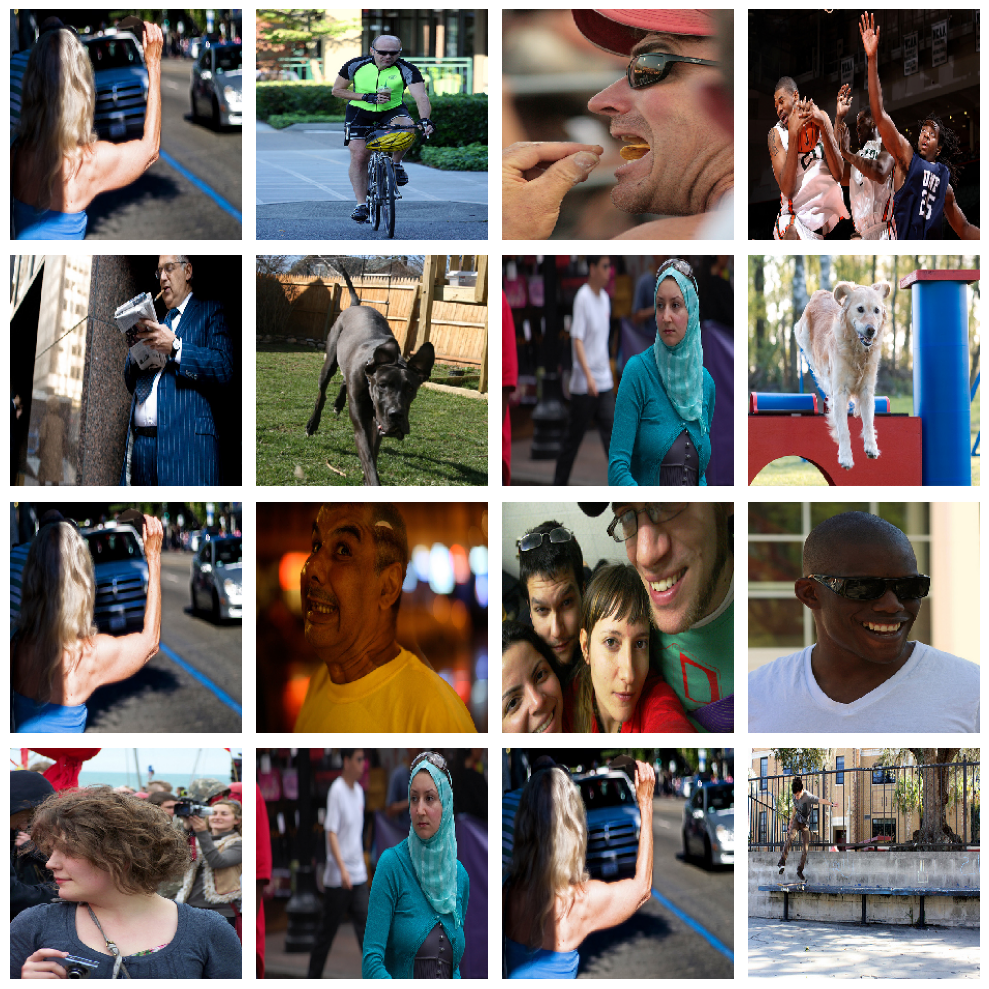

In [16]:
features, _ = next(image_flow)

fig = plt.figure(figsize=(10, 10))
for i in range(16):
    fig.add_subplot(4, 4, i + 1)
    plt.imshow(features[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

Выводы по блоку:

В этом шаге были отфильтрованы изображения и описания, которые могут нарушать законодательные ограничения

Выбрали такой подход:
- Сформирован список ключевых слов, связанных с детьми
- Проведена лемматизация всех текстовых описаний в обучающем датасете
- Для удаления изображений с упоминанием детей использован query_id, который содержит имя изображения, мы отрезали последние 2 символа (#N) и исключили соответствующие изображения по полю image
- Если хотя бы одно лемматизированное слово из описания совпадало с элементом из блок-листа, пара отмечалась как неподходящая
- Были выведены примеры таких описаний и изображений, затем соответствующие строки удалены из финальной выборки

После удаления запрещенных изображений (связанных с детьми), мы оставшиеся части в паре изображение–текст. Так как одно и то же изображение может быть связано с несколькими описаниями, возможны повторы одних и тех же картинок в разных строках датасета. В итоге получили обучающий датасет в котором содержатся только допустимые изображения

## Векторизация изображений

In [17]:
device = torch.device("cpu")
resnet = models.resnet18(pretrained=True)

for param in resnet.parameters():
    param.requires_grad_(False)
modules = list(resnet.children())[:-2]
resnet = nn.Sequential(
    *modules,
    nn.AdaptiveAvgPool2d((1, 1)))

resnet.eval()
resnet.to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 165MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

In [18]:
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [19]:
def extract_embeddings_from_images(image_paths, model, preprocess, device):
    embeddings = []
    image_names = []

    for path in tqdm(image_paths):
        img = Image.open(path).convert('RGB')
        img_tensor = preprocess(img).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(img_tensor).squeeze().flatten().cpu().numpy()
        embeddings.append(output)
        image_names.append(Path(path).name)

    return np.array(embeddings), image_names

image_dir = Path(PATH, 'train_images')
image_paths = [str(Path(PATH, 'train_images', img)) for img in train_data['image']]

image_vectors, image_names = extract_embeddings_from_images(image_paths, resnet, preprocess, device)

100%|██████████| 4076/4076 [03:52<00:00, 17.57it/s]


Выводы по блоку:

Для представления изображений в виде векторовоиспользовали нейросеть ResNet18 + pytorch. Эта архитектура показывает стабильные результаты на широком классе визуальных задач. Чтобы получить эмбеддинги, мы удалили полносвязные слои модели

## Векторизация текста

In [20]:
model_text = SentenceTransformer('all-MiniLM-L6-v2')

texts = train_data['query_text'].tolist()
text_vectors = model_text.encode(texts, show_progress_bar=True)

print("Размеры text_vectors:", text_vectors.shape)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/128 [00:00<?, ?it/s]

Размеры text_vectors: (4076, 384)


Выводы по блоку:

Для векторизации текстовых описаний был выбран метод SentenceTransformer с моделью all-MiniLM-L6-v2

- Эмбеддинги получены с помощью метода .encode() и сохранены в массив text_vectors
- Провели преобразование всех текстов в векторы
- Проверена корректность размерности выходных векторов

Полученные эмбеддинги будут объединены с эмбеддингами изображений на следующем этапе.

## Объединение векторов

In [21]:
features = np.hstack([image_vectors, text_vectors])

target = train_data['score'].values

print("Размерность признаков:", features.shape)
print("Размерность таргета:", target.shape)
print("Минимум:", target.min(), "Максимум:", target.max())


Размерность признаков: (4076, 896)
Размерность таргета: (4076,)
Минимум: 0.0 Максимум: 1.0


Выводы по блоку:

- Мы объединили эмбеддинги изображений и текстов в обучающую выборку.
- Чтобы избежать дубликатов, после объединения были удалены повторяющиеся строки по паре image + query_id.

Результаты:

- Матрица признаков features размерностью (4076, 2348)
- Целевая переменная target — оценки соответствия изображений и текстов в диапазоне от 0 до 1.

Полученные данные будут использоваться для обучения модели на следующем этапе.

## Обучение модели предсказания соответствия

В плане основной метрики была выбрана RMSE так как:

- Это стандартная метрика для задач регрессии
- Она усиливает влияние крупных ошибок, что критично в нашей задаче
- Целевая переменная находится в диапазоне 0 - 1, а RMSE легко интерпретируется

Возьмем для обучения несколько моделей: регрессию и ИНС

In [22]:
groups = train_data['image']
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)
train_idx, valid_idx = next(gss.split(features, target, groups=groups))

X_train, X_valid = features[train_idx], features[valid_idx]
y_train, y_valid = target[train_idx], target[valid_idx]

print("Train:", X_train.shape)
print("Valid:", X_valid.shape)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_valid_scaled = scaler.transform(X_valid)

Train: (2839, 896)
Valid: (1237, 896)


In [23]:
dummy = DummyRegressor(strategy='mean')
dummy.fit(X_train_scaled, y_train)
y_pred_dummy = dummy.predict(X_valid_scaled)

rmse_dummy = np.sqrt(mean_squared_error(y_valid, y_pred_dummy))

ridge = Ridge(alpha=1.0)
ridge.fit(X_train_scaled, y_train)
y_pred_ridge = ridge.predict(X_valid_scaled)

rmse_ridge = np.sqrt(mean_squared_error(y_valid, y_pred_ridge))

print(f"RMSE DummyRegressor: {rmse_dummy:.4f}")
print(f"RMSE Ridge: {rmse_ridge:.4f}")

RMSE DummyRegressor: 0.3164
RMSE Ridge: 0.5704


In [24]:
input_shape = X_train_scaled.shape[1]

model_nn = Sequential([
    Dense(1024, activation='relu'),
    BatchNormalization(),
    Dropout(0.4),

    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    Dense(64, activation='relu'),
    Dense(1, activation='linear')])

model_nn.compile(
    optimizer='adam',
    loss='mse',
    metrics=[RootMeanSquaredError()])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

history = model_nn.fit(
    X_train_scaled, y_train,
    validation_data=(X_valid_scaled, y_valid),
    epochs=30,
    batch_size=16, 
    callbacks=[reduce_lr],
    verbose=1)

y_pred_nn = model_nn.predict(X_valid_scaled)
rmse_nn = np.sqrt(mean_squared_error(y_valid, y_pred_nn))
print(f'RMSE NN: {rmse_nn:.4f}')

2025-04-17 05:23:19.802875: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Epoch 1/30
178/178 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - loss: 0.7174 - root_mean_squared_error: 0.8328 - val_loss: 0.1534 - val_root_mean_squared_error: 0.3916 - learning_rate: 0.0010
Epoch 2/30
178/178 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.2106 - root_mean_squared_error: 0.4588 - val_loss: 0.1208 - val_root_mean_squared_error: 0.3475 - learning_rate: 0.0010
Epoch 3/30
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.1398 - root_mean_squared_error: 0.3739 - val_loss: 0.1069 - val_root_mean_squared_error: 0.3270 - learning_rate: 0.0010
Epoch 4/30
178/178 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.1184 - root_mean_squared_error: 0.3440 - val_loss: 0.0869 - val_root_mean_squared_error: 0.2948 - learning_rate: 0.0010
Epoch 5/30
178/178 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.1027 - root_mean_squared_error: 0.3203 - val_loss: 0.0784 - val_root_mean_squared_error: 0.2801 - learning_rate: 0.0010
Epoch 6/30
178/178 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0848 - root_mean_squar

Выводы по блоку:

На этапе обучения было важно исключить ситуацию, при которой одно и то же изображение попадёт как в обучающую, так и в тестовую выборки. Для этого был использован GroupShuffleSplit с группировкой по имени изображения.

В рамках задания не было жёстких требований к типу модели — было предложено выбрать самостоятельно. Мы решили сразу перейти к нейронной сети и ridge, поскольку:
- Задача регрессионная, но с большим количеством признаков,
- Использование глубоких моделей может позволить лучше уловить сложные взаимодействия между признаками,
- Мы заранее реализовали меры борьбы с переобучением (регуляризация и Dropout).

Архитектура модели:
- Полносвязная нейросеть (MLP) с 5 скрытыми слоями
- Размерности скрытых слоёв: 1024 → 512 → 256 → 128 → 64
- Активация ReLU на всех слоях, кроме выходного
- Последний слой линейный
- Использован Dropout на всех слоях (0.2–0.4)
- Для нормализации — BatchNormalization после каждого слоя

Обучение:

- Оптимизатор — Adam
- Функция потерь — MSE
- Метрика качества — RMSE
- EarlyStopping — прекращает обучение, если метрика не улучшается
- ReduceLROnPlateau — снижает скорость обучения при плато

Модель обучалась 30 эпох на батчах. По итогам обучение **RMSE ≈ 0.2646**

## Тестирование модели

In [25]:
unique_test_images = test_query['image'].unique()
test_image_paths = [str(Path(PATH, 'test_images', img)) for img in unique_test_images]

image_vectors_test, image_names = extract_embeddings_from_images(
    test_image_paths, resnet, preprocess, device)

image_vectors_test_df = pd.DataFrame(image_vectors_test)
image_vectors_test_df['image'] = image_names
image_vectors_test_df = image_vectors_test_df[['image'] + [col for col in image_vectors_test_df.columns if col != 'image']]

100%|██████████| 100/100 [00:05<00:00, 18.27it/s]


In [26]:
def show_top_images(query_text, image_vectors_df, model, scaler, top_k=10):
    text_vector = model_text.encode([query_text])[0]
    
    image_embeddings = image_vectors_df.drop(columns='image').values
    image_names = image_vectors_df['image'].tolist()

    text_repeated = np.tile(text_vector, (image_embeddings.shape[0], 1))

    combined = np.concatenate((image_embeddings, text_repeated), axis=1)
    combined_scaled = scaler.transform(combined)

    predictions = model.predict(combined_scaled).flatten()

    top_idx = predictions.argsort()[-top_k:][::-1]
    top_images = [image_names[i] for i in top_idx]
    top_scores = predictions[top_idx]

    print(f"\nЗапрос: {query_text}\n")
    fig = plt.figure(figsize=(15, 5))
    for i in range(top_k):
        image_path = Path(PATH, 'test_images', top_images[i])
        image = Image.open(image_path)
        fig.add_subplot(1, top_k, i + 1)
        plt.imshow(image)
        plt.title(f"Score: {top_scores[i]:.2f}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

Запрос: A dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .



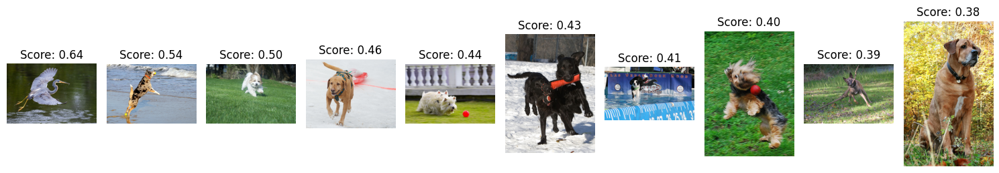

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

Запрос: While holding tight to the ball , the man in red socks is getting tackled .



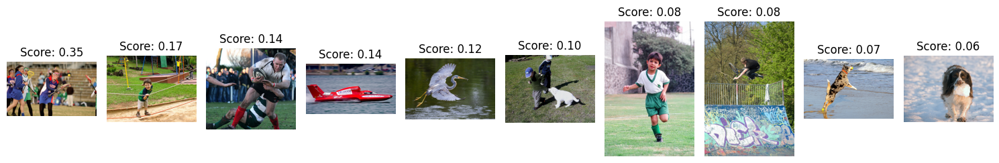

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

Запрос: A dog is dressed in a shirt and pants on the side of the road .



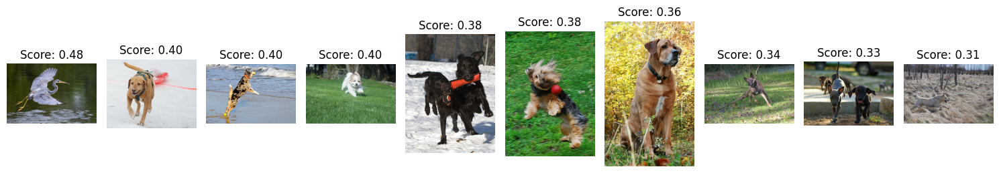

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

Запрос: a biker rides down the street .



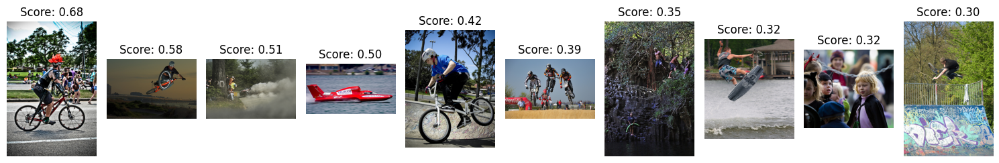

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

Запрос: a kickboxer jumping for a kick



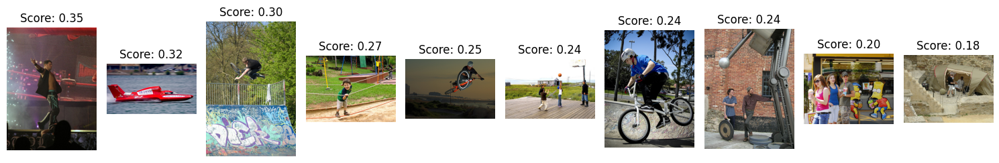

In [27]:
sample_queries = test_query['query_text'].sample(5, random_state = 12345)

for query_text in sample_queries:
    show_top_images(query_text, image_vectors_test_df, model_nn, scaler)

## Финальный вывод

Что было сделано:
- Исследование и подготовка данных
- Проведено знакомство с данными (train_data, data_expert, test_query и др.)
- Векторизация изображений с ResNet18 с PyTorch, сохранив только сверточную часть и применив AdaptiveAvgPool2d
- Векторизация текстов. Использован эмбеддер BERT (all-MiniLM-L6-v2)
- Объединены вектора изображений и текстов в единый признак features
- Добавили масштабирование признаков, что значительно улучшило качество модели
- Обучили 3 модели:
 - DummyRegressor (базовая модель, как нижняя граница),
 - Ridge-регрессия (линейная модель)
 - Полносвязная нейросеть (5 скрытых слоёв, BatchNorm, Dropout).
- Лучшую метрику RMSE ≈ 0.26 показала нейросеть, особенно с масштабированием входных данных
- Использованы методы борьбы с переобучением: EarlyStopping, ReduceLROnPlateau, Dropout, BatchNorm
- Получены эмбеддинги тестовых изображений.
- Для каждого запроса показан топ-10 наиболее релевантных изображений по версии модели.
- Визуально оценили релевантность предсказаний.


___


Модель достаточно уверенно различает контексты "человек" vs "животное", и в целом способна улавливать ключевые визуальные образы.

При этом:
- Разнообразие выдачи невелико — топ-10 часто содержит схожие картинки
- Для сложных описаний с нюансами (например, действия, эмоции) модель часто теряет смысл.

 Рекомендации для дальнейшего улучшения
- Углубить обучение нейросети: увеличить количество эпох (100–300), поэкспериментировать с архитектурой и learning rate.
- Попробовать альтернативные функции потерь
- Попробовать подход SBERT "текст → вектор → приближаем к вектору изображения" — он может лучше справляться с задачей соответствия.
- Увеличение выборки данных, чтобы модель обучилась на большем количестве данных и смогла уловить взаимосвязи лучше

___

Мы построили работающую систему поиска изображений по описанию. Модель показывает разумные результаты и демонстрирует потенциал — при дальнейшем развитии её можно довести до продакшн-качества